# Data Analysis with pandas, Bokeh & Holoviews

[Bokeh](https://github.com/bokeh/bokeh) is a Python library for interactive visualization that targets web browsers for representation. It's easy to embed Bokeh visualization to flask and django apps. Also Bokeh can transform visualization written in other libraries like matplotlib, seaborn, ggplot.

[Holoviews](http://holoviews.org/getting_started/index.html) focuses on bundling data together with the appropriate metadata to support both analysis and visualization. Instead of building a plot using direct calls to a plotting library, you first describe your data with a small amount of crucial semantic information required to make it visualizable, then you specify additional metadata as needed to determine more detailed aspects of your visualization. The Renderer(beside bokeh there is also one for matplotlib and plotly) converts the HoloViews object to a HoloViews Plot , which holds the Bokeh models that will be rendered to screen. The Bokeh models can then be converted to embeddable or standalone HTML and be rendered in the browser. This conversion is usually done in the background using the `figure_data` method. 

In Bokeh the `Document` is the basic unit at which Bokeh models (such as plots, layouts and widgets) are held and serialized. The serialized JSON representation is then sent to BokehJS on the client-side browser. When in 'server' mode the BokehRenderer will automatically return a server Document.

By adding `BokehRenderer.server_doc(holoviews_object)` to the end of the notebook any regular .ipynb file can be made into a valid Bokeh app, which can be served with `bokeh serve example.ipynb`.

HoloMaps are a core part of HoloViews and are essential for generating animated visualizations. They also provide highly useful ways to manipulate your data for display and have several useful properties, they :
* are ordered (internally they use ``OrderedDictionary``, or if installed, the optimized ``cyordereddict``).
* let you index your data with an arbitrary number of dimensions (e.g. ``date`` and `batch-number`), not just one like a Python dictionary. The dimensions used may be simple strings, or objects recording the name, type, and physical units of the dimension.
* let you select portions of your data by slicing each available dimension independently.
* also provide ways to transform your data by sampling, reducing and collapsing the data ``Elements``.
* Dimensions in a ``HoloMap`` may be mapped onto parameter spaces for easy visualization of a portion of your multidimensional data space.

Creating a HoloMap is just like creating a Python dictionary, and so you can either pass a dictionary object or a list of (key,value) pairs. The keys can each be a single value for a one-dimensional HoloMap, or tuples for multiple Dimensions

Other frameworks:
https://www.youtube.com/watch?v=FytuB8nFHPQ&feature=youtu.be
JupyterLab now prefers a model where arbitrary javascript is no longer allowed to be embedded in a cell's output, which is how many interactive Jupyter Notebook modules used to work. 
https://github.com/jupyterlab/jupyter-renderers

Since version 1.10 he 1.10 JupyterLab support is included, and new plot types including Sankey diagrams, Hex Binning, Violins, Chord plots are provided. http://blog.pyviz.org/release_1.10.html

## Bokeh Details
Bokeh is actually composed of two library components.

1. JavaScript library **BokehJS**: This library is responsible for all of the rendering and user interaction. Input is a collection of declarative JSON objects that comprise a “scenegraph”. The objects in this scenegraph describe everything that BokehJS should handle: what plots and widgets are present and in what arrangement, what tools and renderers and axes the plots will have, etc. These JSON objects are converted into [Backbone Models](http://backbonejs.org/) in the browser, and are rendered by corresponding Backbone Views.
2. A library (Python, R, Scala, Julia) that can generate the JSON: It exposes a set of “model” classes that exactly mirror the set of Backbone Models that are created in the browser. Below Python model classes know how to validate their content and attributes, and also how to serialize themselves to JSON. All of these low level models live in the low-level bokeh.models interface. However, it provides no help with assembling the models in meaningful or correct ways. It is entirely up to developers to build the scenegraph “by hand”. 

<img src="../img/Bokeh_Intro.png" width="300px" />

### BokePlotting Interface

[bokeh.plotting](http://bokeh.pydata.org/en/latest/docs/reference/plotting.html#bokeh-plotting) interface is similar to Matplotlib or Matlab style plotting interfaces. Assembling the appropriate Bokeh Models to form a scenegraph that BokehJS can render is handled automatically. The main class in the bokeh.plotting interface is the Figure class. This is a subclass of the basic Plot model, that includes methods for adding different kinds of glyphs to a plot. Additionally it composes default axes, grids, and tools in a predefined way (create Figure objects by figure() function). Glyph methods like Figure.circle are available to add renderers for the data. 

### Bokeh output options

Most common for interactive usage are:

* output_file: For generating simple standalone HTML documents for Bokeh visualizations.
* output_notebook: For displaying Bokeh visualizations inline in Jupyter/Zeppelin notebook cells. 

Note: Arbitrary script execution in outputs is disallowed in JLab because it's a huge security risk. Instead jupyter introduced  JLab extension system, that makes it easier to build Javascript viewers in a safer fashion.

Bokeh also comes with a powerful command line tool bokeh that can also be used to generate various kinds of output:

* bokeh html: Create standalone HTML documents from any kind of Bokeh application source: e.g., python scripts, app directories, JSON files, and others.
* bokeh json. Generate a serialized JSON representation of a Bokeh document from any kind of Bokeh application source.
* bokeh serve: Publish Bokeh documents as interactive web applications. 

### Bokeh plots

In [1]:
from bokeh.plotting import figure, output_file, output_notebook, show
# output method for notebooks, note that jupyter lab requires jupyterlab_bokeh labextension
output_notebook()
p = figure(plot_width=400, plot_height=400)
# single line glyph using the line() glyph method in order to create a line renderer
p.line([1, 2, 3, 4, 5], [6, 7, 2, 4, 5], line_width=2)
show(p)

Loading BokehJS ...

In [2]:
# hover
from bokeh.plotting import figure, output_notebook, show
from bokeh.models import HoverTool, BoxSelectTool #For enabling tools

# output to notebook
output_notebook()

#Add tools
TOOLS = [BoxSelectTool(), HoverTool()]

p = figure(plot_width=400, plot_height=400, tools=TOOLS)

# add a square with a size, color, and alpha
p.square([2, 5, 6, 4, 8], [2, 3, 2, 1, 2], size=20, color="navy", alpha=0.5)

#Visual Elements
p.xaxis.axis_label = "X-axis"
p.yaxis.axis_label = "Y-axis"

show(p)

Loading BokehJS ...

In [3]:
from collections import OrderedDict
from math import log, sqrt

import numpy as np
import pandas as pd
from six.moves import cStringIO as StringIO
from bokeh.plotting import figure, output_notebook, show

# output method for notebooks, note that jupyter lab requires jupyterlab_bokeh labextension
output_notebook()

antibiotics = """
bacteria,                        penicillin, streptomycin, neomycin, gram
Mycobacterium tuberculosis,      800,        5,            2,        negative
Salmonella schottmuelleri,       10,         0.8,          0.09,     negative
Proteus vulgaris,                3,          0.1,          0.1,      negative
Klebsiella pneumoniae,           850,        1.2,          1,        negative
Brucella abortus,                1,          2,            0.02,     negative
Pseudomonas aeruginosa,          850,        2,            0.4,      negative
Escherichia coli,                100,        0.4,          0.1,      negative
Salmonella (Eberthella) typhosa, 1,          0.4,          0.008,    negative
Aerobacter aerogenes,            870,        1,            1.6,      negative
Brucella antracis,               0.001,      0.01,         0.007,    positive
Streptococcus fecalis,           1,          1,            0.1,      positive
Staphylococcus aureus,           0.03,       0.03,         0.001,    positive
Staphylococcus albus,            0.007,      0.1,          0.001,    positive
Streptococcus hemolyticus,       0.001,      14,           10,       positive
Streptococcus viridans,          0.005,      10,           40,       positive
Diplococcus pneumoniae,          0.005,      11,           10,       positive
"""

drug_color = OrderedDict([
    ("Penicillin",   "#0d3362"),
    ("Streptomycin", "#c64737"),
    ("Neomycin",     "black"  ),
])

gram_color = {
    "positive" : "#aeaeb8",
    "negative" : "#e69584",
}

df = pd.read_csv(StringIO(antibiotics),
                 skiprows=1,
                 skipinitialspace=True,
                 engine='python')

width = 800
height = 800
inner_radius = 90
outer_radius = 300 - 10

minr = sqrt(log(.001 * 1E4))
maxr = sqrt(log(1000 * 1E4))
a = (outer_radius - inner_radius) / (minr - maxr)
b = inner_radius - a * maxr

def rad(mic):
    return a * np.sqrt(np.log(mic * 1E4)) + b

big_angle = 2.0 * np.pi / (len(df) + 1)
small_angle = big_angle / 7

p = figure(plot_width=width, plot_height=height, title="",
    x_axis_type=None, y_axis_type=None,
    x_range=(-420, 420), y_range=(-420, 420),
    min_border=0, outline_line_color="black",
    background_fill_color="#f0e1d2")

p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# annular wedges
angles = np.pi/2 - big_angle/2 - df.index.to_series()*big_angle
colors = [gram_color[gram] for gram in df.gram]
p.annular_wedge(
    0, 0, inner_radius, outer_radius, -big_angle+angles, angles, color=colors,
)

# small wedges
p.annular_wedge(0, 0, inner_radius, rad(df.penicillin),
                -big_angle+angles+5*small_angle, -big_angle+angles+6*small_angle,
                color=drug_color['Penicillin'])
p.annular_wedge(0, 0, inner_radius, rad(df.streptomycin),
                -big_angle+angles+3*small_angle, -big_angle+angles+4*small_angle,
                color=drug_color['Streptomycin'])
p.annular_wedge(0, 0, inner_radius, rad(df.neomycin),
                -big_angle+angles+1*small_angle, -big_angle+angles+2*small_angle,
                color=drug_color['Neomycin'])

# circular axes and lables
labels = np.power(10.0, np.arange(-3, 4))
radii = a * np.sqrt(np.log(labels * 1E4)) + b
p.circle(0, 0, radius=radii, fill_color=None, line_color="white")
p.text(0, radii[:-1], [str(r) for r in labels[:-1]],
       text_font_size="8pt", text_align="center", text_baseline="middle")

# radial axes
p.annular_wedge(0, 0, inner_radius-10, outer_radius+10,
                -big_angle+angles, -big_angle+angles, color="black")

# bacteria labels
xr = radii[0]*np.cos(np.array(-big_angle/2 + angles))
yr = radii[0]*np.sin(np.array(-big_angle/2 + angles))
label_angle=np.array(-big_angle/2+angles)
label_angle[label_angle < -np.pi/2] += np.pi # easier to read labels on the left side
p.text(xr, yr, df.bacteria, angle=label_angle,
       text_font_size="9pt", text_align="center", text_baseline="middle")

# OK, these hand drawn legends are pretty clunky, will be improved in future release
p.circle([-40, -40], [-370, -390], color=list(gram_color.values()), radius=5)
p.text([-30, -30], [-370, -390], text=["Gram-" + gr for gr in gram_color.keys()],
       text_font_size="7pt", text_align="left", text_baseline="middle")

p.rect([-40, -40, -40], [18, 0, -18], width=30, height=13,
       color=list(drug_color.values()))
p.text([-15, -15, -15], [18, 0, -18], text=list(drug_color),
       text_font_size="9pt", text_align="left", text_baseline="middle")

show(p)

Loading BokehJS ...

In [4]:
from bokeh.io import show, output_file
from bokeh.models import ColumnDataSource, FactorRange
from bokeh.plotting import figure



fruits = ['Apples', 'Pears', 'Nectarines', 'Plums', 'Grapes', 'Strawberries']
years = ['2015', '2016', '2017']

data = {'fruits' : fruits,
        '2015'   : [2, 1, 4, 3, 2, 4],
        '2016'   : [5, 3, 3, 2, 4, 6],
        '2017'   : [3, 2, 4, 4, 5, 3]}

# this creates [ ("Apples", "2015"), ("Apples", "2016"), ("Apples", "2017"), ("Pears", "2015), ... ]
x = [ (fruit, year) for fruit in fruits for year in years ]
counts = sum(zip(data['2015'], data['2016'], data['2017']), ()) # like an hstack

source = ColumnDataSource(data=dict(x=x, counts=counts))

p = figure(x_range=FactorRange(*x), plot_height=350, title="Fruit Counts by Year",
           toolbar_location=None, tools="")

p.vbar(x='x', top='counts', width=0.9, source=source)

p.y_range.start = 0
p.x_range.range_padding = 0.1
p.xaxis.major_label_orientation = 1
p.xgrid.grid_line_color = None

show(p)


# Data Exploration with pandas
## Import and group data

In [28]:
import pandas as pd
import codecs
import bokeh.io
from subprocess import check_output
# from bokeh import Donut, HeatMap, Histogram, Line, Scatter, show, output_notebook, output_file
from bokeh.plotting import figure

print(check_output(["ls"]).decode("utf8"))

with codecs.open("albumlist.csv", "r", "ASCII", "ignore") as file:
    album_list = pd.read_table(file, delimiter=",")
album_list.head()

Data Visualization with Python.ipynb
albumlist.csv
bokeh.ipynb
holoviews.html



,Number,Year,Album,Artist,Genre,Subgenre
0,1,1967,Sgt. Pepper's Lonely Hearts Club Band,The Beatles,Rock,"Rock & Roll, Psychedelic Rock"
1,2,1966,Pet Sounds,The Beach Boys,Rock,"Pop Rock, Psychedelic Rock"
2,3,1966,Revolver,The Beatles,Rock,"Psychedelic Rock, Pop Rock"
3,4,1965,Highway 61 Revisited,Bob Dylan,Rock,"Folk Rock, Blues Rock"
4,5,1965,Rubber Soul,The Beatles,"Rock, Pop",Pop Rock


### Resample and Refine data structure

In [29]:
#add Genre_Refined and Subgenre_Refined
for lab, row in album_list.iterrows():
    album_list.loc[lab, "Genre_Refined"] = row["Genre"].split(',')[0]
    album_list.loc[lab, "Subgenre_Refined"] = row["Subgenre"].split(',')[0]
album_list.head()

,Number,Year,Album,Artist,Genre,Subgenre,Genre_Refined,Subgenre_Refined
0,1,1967,Sgt. Pepper's Lonely Hearts Club Band,The Beatles,Rock,"Rock & Roll, Psychedelic Rock",Rock,Rock & Roll
1,2,1966,Pet Sounds,The Beach Boys,Rock,"Pop Rock, Psychedelic Rock",Rock,Pop Rock
2,3,1966,Revolver,The Beatles,Rock,"Psychedelic Rock, Pop Rock",Rock,Psychedelic Rock
3,4,1965,Highway 61 Revisited,Bob Dylan,Rock,"Folk Rock, Blues Rock",Rock,Folk Rock
4,5,1965,Rubber Soul,The Beatles,"Rock, Pop",Pop Rock,Rock,Pop Rock


In [7]:
album_list.dtypes

Number               int64
Year                 int64
Album               object
Artist              object
Genre               object
Subgenre            object
Genre_Refined       object
Subgenre_Refined    object
dtype: object

In [8]:
#top 10 albums
top_albums = album_list.head(10)
#Get artists and albums into a new data frame
top_albums_a = top_albums['Artist']
top_albums_b = top_albums['Album']
top_albums_final = pd.concat([top_albums_a, top_albums_b], axis=1)
#groupby and summarize
top_albums_chart = top_albums_final.groupby(['Artist', 'Album']).count()
top_albums_chart

Empty DataFrame
Columns: []
Index: [(Bob Dylan, Blonde on Blonde), (Bob Dylan, Highway 61 Revisited), (Marvin Gaye, What's Going On), (The Beach Boys, Pet Sounds), (The Beatles, Revolver), (The Beatles, Rubber Soul), (The Beatles, Sgt. Pepper's Lonely Hearts Club Band), (The Beatles, The Beatles ("The White Album")), (The Clash, London Calling), (The Rolling Stones, Exile on Main St.)]

### Grouping and counting and sorting

In [9]:
#get a count of how many times each artist made it into the list
artists_count = album_list.groupby(['Artist'], as_index=False).count()
#find the top 10 artists
top_artists = artists_count.sort_values(by='Number', ascending=False).head(10)
top_artists = top_artists.reset_index().drop(['index', 'Album','Year','Genre','Subgenre', 'Genre_Refined', 'Subgenre_Refined'], axis=1)
top_artists.head(10)

,Artist,Number
0,The Beatles,10
1,Bob Dylan,10
2,The Rolling Stones,10
3,Bruce Springsteen,8
4,The Who,7
5,Radiohead,5
6,U2,5
7,Led Zeppelin,5
8,Elton John,5
9,David Bowie,5


In [10]:
#get the artists and corresponding counts into two lists for plotting
top_artists_list = top_artists.Artist.values.tolist()
top_artists_count = top_artists.Number.astype(float).values.tolist()
#visualize the data using bokeh
#output_file("top_artists.html", title="top artists")
p = figure(x_range=top_artists_list, plot_height = 500, plot_width = 500)

#set x-axis properties
p.xgrid.visible = False
p.xaxis.major_label_orientation = 3.14/4
p.xaxis.axis_label = 'Artist Name'

#set y-axis properties
p.ygrid.visible = False
p.yaxis.axis_label = 'Album Count'

#draw circles
p.circle(y=top_artists_count, x=top_artists_list, size=15, fill_color="black")
show(p)

In [11]:
#get count of albums in each year
yearwise_albums = album_list.groupby(['Year'], as_index=False).count()
yearwise_albums = yearwise_albums.sort_values(by='Year').reset_index().drop(['index', 'Album', 'Artist','Genre','Subgenre','Subgenre_Refined','Genre_Refined'], axis=1)
yearwise_albums.head(5)

,Year,Number
0,1955,1
1,1956,2
2,1957,2
3,1958,1
4,1959,4


In [12]:
#get the artists and corresponding counts into two lists for plotting
year_list = yearwise_albums.Year.values.tolist()
year_count = yearwise_albums.Number.astype(float).values.tolist()
#visulaizing the data using bokeh line graphs
#output_file("yearwise_albums.html", title="yearwise_albums")
p = figure(plot_width=400, plot_height=400)
p.line(x=year_list, y=year_count)
p.yaxis.axis_label = 'Number of Albums'
show(p)

### Pivoting

In [13]:
#pivot the data and get a subset of the pivoted data where each subgenre has a count of more than 5
pivoted = pd.pivot_table(album_list, index=['Genre_Refined', 'Subgenre_Refined'], values=['Number'], aggfunc='count')
pivoted_subset = pivoted[pivoted['Number'] > 5]
pivoted_subset = pivoted_subset.reset_index()
pivoted_subset

,Genre_Refined,Subgenre_Refined,Number
0,Electronic,New Wave,7
1,Electronic,Synth-pop,6
2,Folk,Country,9
3,Funk / Soul,Rhythm & Blues,11
4,Funk / Soul,Soul,19
5,Hip Hop,None,16
6,Rock,Alternative Rock,33
7,Rock,Art Rock,6
8,Rock,Blues Rock,37
9,Rock,Classic Rock,18


In [14]:
#getting yearwise data for each genre
yearwise_data = album_list.groupby(['Year', 'Genre_Refined'], as_index=False).count()
yearwise_data = yearwise_data.sort_values(by='Year').reset_index().drop(['index', 'Album', 'Artist','Genre','Subgenre','Subgenre_Refined'], axis=1)
yearwise_data.head(25)

,Year,Genre_Refined,Number
0,1955,Jazz,1
1,1956,Jazz,1
2,1956,Rock,1
3,1957,Rock,2
4,1958,Blues,1
5,1959,Jazz,4
6,1960,Funk / Soul,1
7,1960,Jazz,1
8,1960,Rock,1
9,1961,Funk / Soul,1


## Display data
### Heatmaps

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
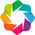

:HeatMap   [Year,Genre_Refined]   (Number)

In [15]:
import holoviews as hv
hv.extension('bokeh')
hv.config(warn_options_call=True)
%opts HeatMap (cmap='viridis') [tools=['hover'] colorbar=True width=750, height=500]
#%output filename="holoviews" fig="html"
# ignore extra columns to holoviews doesn't show extra sliders
to_keep = ['Year', 'Genre_Refined', 'Number']
table = hv.Table(yearwise_data[to_keep])
dmap = table.to.heatmap(kdims=['Year', 'Genre_Refined'], vdims='Number')
dmap

### Scatterplot - grouped by subgenres

In [27]:
#count subgenres yearwise and subset it for rock music
yearwise_subgenres = album_list.groupby(['Year', 'Genre_Refined', 'Subgenre_Refined'], as_index=False).count()
rock_subgenres_yearwise = yearwise_subgenres[yearwise_subgenres['Genre_Refined'] == 'Rock'].reset_index().drop(['index', 'Album', 'Artist','Genre','Subgenre'], axis=1)
rock_subgenres_yearwise.head()

,Year,Genre_Refined,Subgenre_Refined,Number
0,1956,Rock,Rock & Roll,1
1,1957,Rock,Rock & Roll,1
2,1957,Rock,Rockabilly,1
3,1960,Rock,Blues Rock,1
4,1963,Rock,Beat,1


In [53]:
#visualizing the data using holoviews scatterplot
%opts Scatter(color='b' marker='s' size=5) [tools=['hover']  width=750, height=500]
hv.Scatter((rock_subgenres_yearwise.Year.values.tolist(), 
            rock_subgenres_yearwise.Subgenre_Refined.values.tolist()))

/conda/lib/python3.6/site-packages/holoviews/core/data/pandas.py:130: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  zip(columns, data)])


:Scatter   [x]   (y)

# Holomaps Details
## Dimensions and Table
Discrete sample coordinates, or bins are key dimensions (or kdims for short) in HoloViews. The observer or dependent variables, on the other hand, are referred to as value dimensions (vdims), and are ordinarily measured or calculated given the independent variables. The simplest useful form of a Dataset object is therefore a column 'x' and a column 'y' corresponding to the key dimensions and value dimensions respectively. An obvious visual representation of this data is a Table:

In [54]:
xs = np.arange(10)
ys = np.exp(xs)

table = hv.Table((xs, ys), kdims=['x'], vdims=['y'])
table

/conda/lib/python3.6/site-packages/holoviews/core/data/pandas.py:130: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  zip(columns, data)])


:Table   [x]   (y)

## Visualizations
Each of these three plots uses the same data, but represents a different assumption about the semantic meaning of that data:
* **Scatter plot** is appropriate if that data consists of independent samples
* **Curve plot** is appropriate for samples chosen from an underlying smooth function
* **Bars plot** is appropriate for independent categories of data
All have the same dimensionality and can be easily converted to each other.

As a guide to which Elements can be converted to each other, those of the same dimensionality here should be interchangeable, because of the underlying similarity of their columnar representation:

- 0D: BoxWhisker, Spikes, Distribution`*`,
- 1D: Scatter, Curve, ErrorBars, Spread, Bars, BoxWhisker, Regression`*`
- 2D: Points, HeatMap, Bars, BoxWhisker, Bivariate`*`
- 3D: Scatter3D, TriSurface, VectorField, BoxWhisker, Bars

`*`requires Seaborn

In [58]:
%opts Scatter(color='b' marker='s' size=5)[width=300, height=300]
hv.Scatter(table) + hv.Curve(table) + hv.Bars(table)

:Layout
   .Scatter.I :Scatter   [x]   (y)
   .Curve.I   :Curve   [x]   (y)
   .Bars.I    :Bars   [x]   (y)

## Construct datasets
Dataset types can be constructed using one of three supported formats, 
1. a dictionary of columns, 
2. an NxD array with N rows and D columns
3. pandas dataframes

In [60]:
print(hv.Scatter({'x': xs, 'y': ys}) +
      hv.Scatter(np.column_stack([xs, ys])) +
      hv.Scatter(pd.DataFrame({'x': xs, 'y': ys})))

:Layout
   .Scatter.I   :Scatter   [x]   (y)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)


In addition to the main storage formats, Dataset Elements support construction from three Python literal formats: (a) An iterator of y-values, (b) a tuple of columns, and (c) an iterator of row tuples.

In [61]:
print(hv.Scatter(ys) + hv.Scatter((xs, ys)) + hv.Scatter(zip(xs, ys)))

:Layout
   .Scatter.I   :Scatter   [x]   (y)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)


/conda/lib/python3.6/site-packages/holoviews/core/data/pandas.py:130: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  zip(columns, data)])


In [62]:
hv.Dataset.datatype

['dataframe', 'dictionary', 'grid', 'ndelement', 'array', 'dask']

In [64]:
# supported datatypes
print(type(hv.Scatter((xs.astype('float64'), ys), datatype=['array']).data))
print(type(hv.Scatter((xs, ys), datatype=['dictionary']).data))
print(type(hv.Scatter((xs, ys), datatype=['dataframe']).data))

<class 'numpy.ndarray'>
<class 'collections.OrderedDict'>
<class 'pandas.core.frame.DataFrame'>


/conda/lib/python3.6/site-packages/holoviews/core/data/pandas.py:130: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  zip(columns, data)])


## Overlayed data

In [66]:
df = pd.DataFrame({'x': xs, 'y': ys, 'z': ys*2})
overlay = hv.Scatter(df, kdims='x', vdims='y') * hv.Scatter(df, kdims='x', vdims='z')
overlay

:Overlay
   .Scatter.I  :Scatter   [x]   (y)
   .Scatter.II :Scatter   [x]   (z)

## Converting
It's easy to export the data to the three basic formats: arrays, dataframes, and a dictionary of columns.

In [67]:
table.array()

array([[0, 1.0],
       [1, 2.718281828459045],
       [2, 7.38905609893065],
       [3, 20.085536923187668],
       [4, 54.598150033144236],
       [5, 148.4131591025766],
       [6, 403.4287934927351],
       [7, 1096.6331584284585],
       [8, 2980.9579870417283],
       [9, 8103.083927575384]], dtype=object)

In [68]:
table.dframe().head()

,x,y
0,0,1.000000
1,1,2.718282
2,2,7.389056
3,3,20.085537
4,4,54.598150


In [69]:
table.columns()

OrderedDict([('x', array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])),
             ('y',
              array([1.00000000e+00, 2.71828183e+00, 7.38905610e+00, 2.00855369e+01,
                     5.45981500e+01, 1.48413159e+02, 4.03428793e+02, 1.09663316e+03,
                     2.98095799e+03, 8.10308393e+03]))])

## Creating tabular elements

In [72]:
# create a Curve of an exponential function and convert it to a Table with the .table method
xs = np.arange(10)
curve = hv.Curve(zip(xs, np.exp(xs)))
curve * hv.Scatter(curve) + curve.table()

:Layout
   .Overlay.I :Overlay
      .Curve.I   :Curve   [x]   (y)
      .Scatter.I :Scatter   [x]   (y)
   .Table.I   :Table   [x]   (y)

In [71]:
# get a pandas dataframe of the Curve
curve.dframe()

,x,y
0,0,1.000000
1,1,2.718282
2,2,7.389056
3,3,20.085537
4,4,54.598150
5,5,148.413159
6,6,403.428793
7,7,1096.633158
8,8,2980.957987
9,9,8103.083928


## Serilalizing 2D Data
Converting to tabular data is a good way to reveal the differences between Image and Raster elements. Pixeldata are a higher-level abstraction that provides a general-purpose continuous Cartesian coordinate system, with x and y increasing to the right and upwards as in mathematical applications, and each point interpreted as a sample representing the pixel in which it is located (and thus centered within that pixel). 

In [76]:
%opts Points (size=2) [size_index=None]
extents = (-1.6,-2.7,2.0,3)
np.random.seed(42)
mat = np.random.rand(3, 3)

img = hv.Image(mat, bounds=extents)
raster = hv.Raster(mat)

img    * hv.Points(img)    + img.table() + \
raster * hv.Points(raster) + raster.table()

/conda/lib/python3.6/site-packages/holoviews/core/data/pandas.py:130: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  zip(columns, data)])


:Layout
   .Overlay.I  :Overlay
      .Image.I  :Image   [x,y]   (z)
      .Points.I :Points   [x,y]   (z)
   .Table.I    :Table   [x,y]   (z)
   .Overlay.II :Overlay
      .Raster.I :Raster   [x,y]   (z)
      .Points.I :Points   [x,y]   (z)
   .Table.II   :Table   [x,y]   (z)

In [77]:
obs_hmap = hv.HoloMap({i: hv.Image(np.random.randn(10, 10), bounds=(0,0,3,3))
                   for i in range(3)}, kdims=['Observation'])
obs_hmap

:HoloMap   [Observation]
   :Image   [x,y]   (z)

INFO:matplotlib.font_manager:font search path ['/conda/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/ttf', '/conda/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/afm', '/conda/lib/python3.6/site-packages/matplotlib/mpl-data/fonts/pdfcorefonts']
INFO:matplotlib.font_manager:generated new fontManager


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Layout
   .Scatter3D.I :Scatter3D   [Observation,x,y]   (z)
   .Table.I     :Table   [Observation,x,y]   (z)
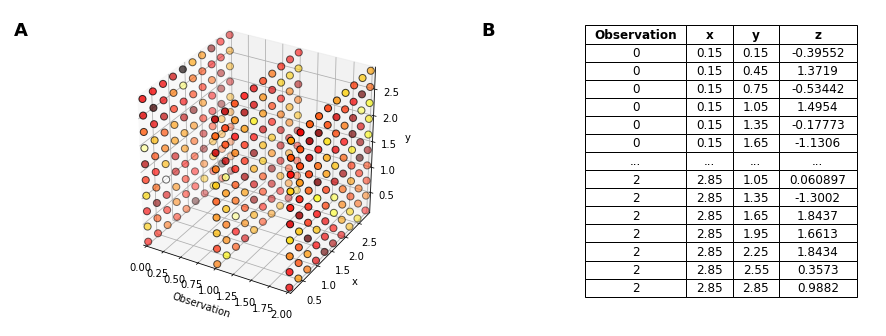

In [79]:
hv.extension('matplotlib')
%opts Layout [fig_size=150] Scatter3D [color_index=3 size_index=None] (cmap='hot' edgecolor='k' s=50)
obs_hmap.table().to.scatter3d() + obs_hmap.table()

## HoloMaps
HoloMaps hold fully constructed Elements at specifically sampled points in a multidimensional space. 

## DynamicMaps
Although HoloMaps are useful for exploring high-dimensional parameter spaces, they can very quickly consume huge amounts of memory to store all these Elements. 
`DynamicMap` addresses these issues by computing and displaying elements dynamically, allowing exploration of much larger datasets:
* generate elements on the fly, allowing the process of exploration to begin immediately.
* allowing exploration of parameters with arbitrary resolution wthout requiring fixed sampling, 
* lazy computing: compute only as much data as the user wishes to explore.
* DynamicMaps store only a portion of the underlying data, in the form of an Element cache and their output is dependent on the particular version of the executed code. 
* DynamicMaps (and particularly their element caches) are typically stateful (with values that depend on patterns of user interaction), which can make them more difficult to reason about.


In [111]:
import holoviews as hv
import numpy as np
hv.notebook_extension()
xvals = np.linspace(-4,0,202)
yvals = np.linspace(4,0,202)
xs,ys = np.meshgrid(xvals, yvals)
# returns an array pattern parameterized by arbitrary alpha and beta parameters inside a HoloViews Image element
def waves_image(alpha, beta):
    return hv.Image(np.sin(((ys/alpha)**alpha+beta)*xs))


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [115]:
waves_image(0,0) + waves_image(0,4)
dmap = hv.DynamicMap(waves_image, kdims=['alpha', 'beta'])
# DynamicMap cannot be displayed without explicit indexing as 'alpha', 'beta' dimension(s) are unbounded. 
dmap.redim.range(alpha=(0,5.0), beta=(1,5.0))

/conda/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in true_divide
  if __name__ == '__main__':
/conda/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':
/conda/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in true_divide
  if __name__ == '__main__':
/conda/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':
/conda/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in true_divide
  if __name__ == '__main__':
/conda/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':


:DynamicMap   [alpha,beta]
   :Image   [x,y]   (z)

In [110]:
def shapes(N, radius=0.5): # Positional keyword arguments are fine
    paths = [hv.Path([[(radius*np.sin(a), radius*np.cos(a)) 
                        for a in np.linspace(-np.pi, np.pi, n+2)]], 
                     extents=(-1,-1,1,1)) 
             for n in range(N,N+3)]
    return hv.Overlay(paths)
%opts Path (linewidth=1.5)
holomap = hv.HoloMap({(N,r):shapes(N, r) for N in [3,4,5] for r in [0.5,0.75]},  kdims=['N', 'radius'])
dmap = hv.DynamicMap(shapes, kdims=['N','radius'])
holomap + dmap


:Layout
   .HoloMap.I    :HoloMap   [N,radius]
      :Overlay
         .Path.I   :Path   [x,y]
         .Path.II  :Path   [x,y]
         .Path.III :Path   [x,y]
   .DynamicMap.I :DynamicMap   [N,radius]
      :Overlay
         .Path.I   :Path   [x,y]
         .Path.II  :Path   [x,y]
         .Path.III :Path   [x,y]

As we have seen we can either declare dimension ranges directly in the kdims or use the redim.range convenience method:

In [117]:
dmap = hv.DynamicMap(shapes, kdims=['N','radius']).redim.range(N=(2,20), radius=(0.5,1.0))
# The [:] slice leaves the soft_range values alone and can be used as a convenient way to clone a DynamicMap
sliced = dmap[4:8, :]
sliced

:DynamicMap   [N,radius]
   :Overlay
      .Path.I   :Path   [x,y]
      .Path.II  :Path   [x,y]
      .Path.III :Path   [x,y]

:GridSpace   [f,ph]
   :NdOverlay   [ph2]
      :Path   [x,y]
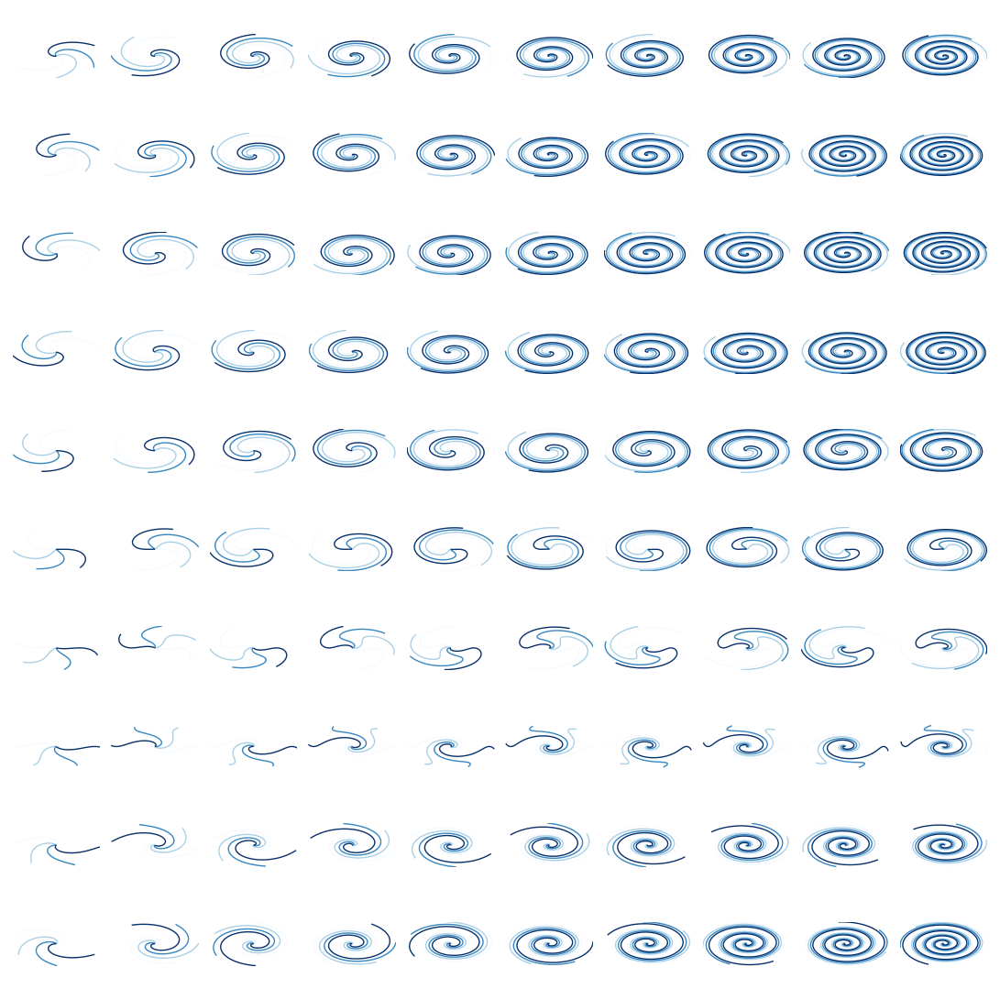

In [120]:
%opts Path (linewidth=1 color=Palette('Blues'))

def spiral_equation(f, ph, ph2):
    r = np.arange(0, 1, 0.005)
    xs, ys = (r * fn(f*np.pi*np.sin(r+ph)+ph2) for fn in (np.cos, np.sin))
    return hv.Path((xs, ys))

spiral_dmap = hv.DynamicMap(spiral_equation, kdims=['f','ph','ph2']).\
        redim.values(f=np.linspace(1, 10, 10),
                     ph=np.linspace(0, np.pi, 10),
                     ph2=np.linspace(0, np.pi, 4))
%opts GridSpace [xaxis=None yaxis=None] Path [bgcolor='w' xaxis=None yaxis=None]
spiral_dmap.groupby(['f', 'ph'], group_type=hv.NdOverlay, container_type=hv.GridSpace)



## Advanced techniques
### Alias variable names

In [87]:
from IPython.display import HTML
hv.notebook_extension()
macro_df = pd.read_csv('http://assets.holoviews.org/macro.csv', '\t')
# rap that call as raw HTML
HTML(macro_df.head().to_html())
# aliases
key_dimensions   = [('year', 'Year'), ('country', 'Country')]
value_dimensions = [('unem', 'Unemployment'), ('capmob', 'Capital Mobility'), 
                    ('gdp', 'GDP Growth'), ('trade', 'Trade')]
# set default options
%output dpi=100
options = hv.Store.options()
opts = hv.Options('plot', aspect=2, fig_size=250, show_frame=False, show_grid=True, legend_position='right')
options.NdOverlay = opts
options.Overlay = opts


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

### Infer the dimensions from the dataframe
Dataset can easily infer the dimensions from the dataframe itself, by supplying the kdims, and it will infer that all other numeric dimensions should be treated as value dimensions (vdims).

:Table   [year,country]   (unem,capmob,gdp,trade)
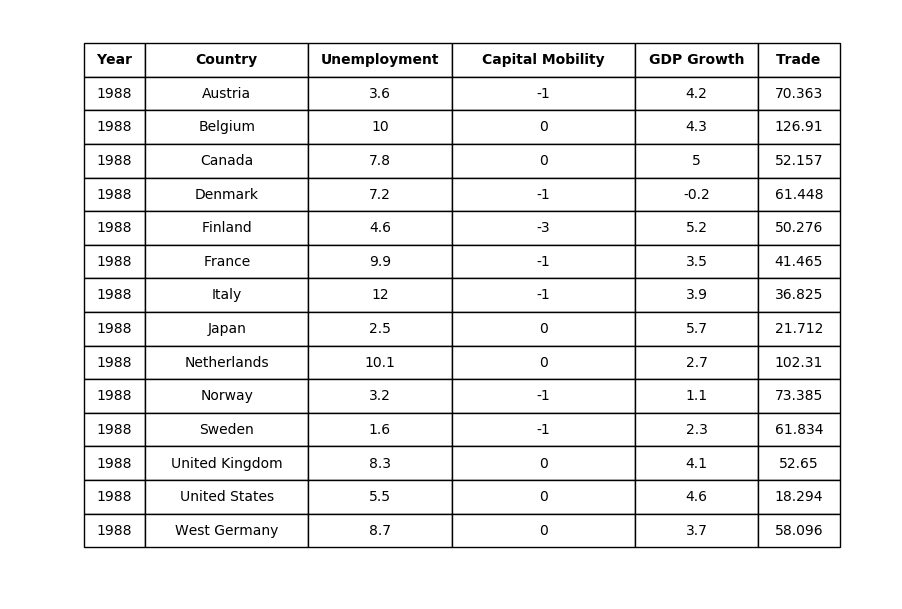

In [88]:
macro = hv.Table(macro_df, kdims=key_dimensions, vdims=value_dimensions)
# sort it and then view the data for one year.
%opts Table [aspect=1.5 fig_size=300]
macro = macro.sort()
macro[1988]

### Explore high dimensional data with container objects
HoloViews also provides powerful container objects to explore high-dimensional data, such as [HoloMap](http://holoviews.org/reference/containers/matplotlib/HoloMap.html), [NdOverlay](http://holoviews.org/reference/containers/matplotlib/NdOverlay.html), [NdLayout](http://holoviews.org/reference/containers/matplotlib/NdLayout.html), and [GridSpace](http://holoviews.org/reference/containers/matplotlib/GridSpace.html). HoloMaps work as a useful interchange format in order to convert to the other container types using its .overlay(), .layout(), and .grid() methods. 

The example shows an overlay of GDP Growth curves by year for each country. Here Year is a key dimension and GDP Growth a value dimension. Country dimension, which is left, can overlayed using the .overlay() method.

:NdOverlay   [country]
   :Curve   [year]   (gdp)
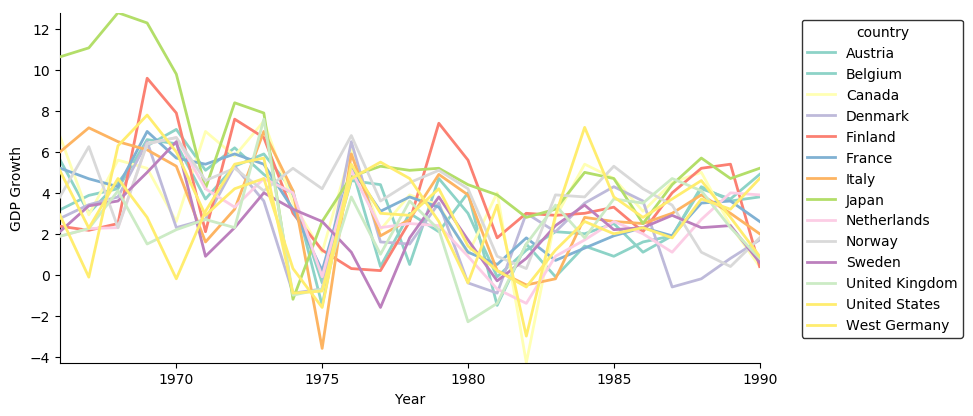

In [89]:
%opts Curve (color=Palette('Set3'))
gdp_curves = macro.to.curve('Year', 'GDP Growth')
gdp_curves.overlay('Country')

In order to make the plot more readableìt's possible ``collapse`` the HoloMap of Curves using a number of functions to visualize the distribution of GDP Growth rates over time. 
1. find the mean curve with `np.std` as the `spreadfn` and cast the result to a `Spread` type
2. compute the min, mean and max curve in the same way
3. put them all inside an Overlay.

:Overlay
   .Spread.Std :Spread   [year]   (gdp,gdp_std)
   .Curve.Max  :Curve   [year]   (gdp)
   .Curve.Mean :Curve   [year]   (gdp)
   .Curve.Min  :Curve   [year]   (gdp)
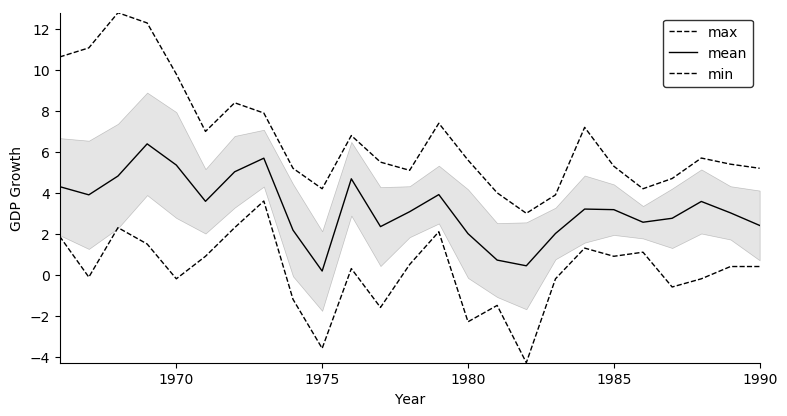

In [90]:
%opts Overlay [bgcolor='w' legend_position='top_right'] Curve (color='k' linewidth=1) Spread (facecolor='gray' alpha=0.2)
hv.Spread(gdp_curves.collapse('Country', np.mean, np.std), label='std') *\
hv.Overlay([gdp_curves.collapse('Country', fn).relabel(name).opts(style=dict(linestyle=ls))
            for name, fn, ls in [('max', np.max, '--'), ('mean', np.mean, '-'), ('min', np.min, '--')]])

### Bars

:Bars   [country,year]   (trade)
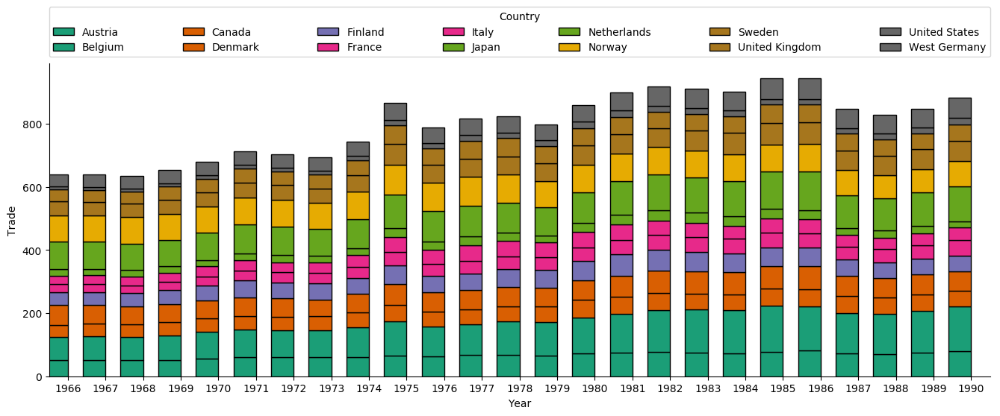

In [91]:
%opts Bars [bgcolor='w' aspect=3 figure_size=450 show_frame=False]
%opts Bars [category_index=2 stack_index=0 group_index=1 legend_position='top' legend_cols=7 color_by=['stack']] (color=Palette('Dark2'))
macro.to.bars(['Country', 'Year'], 'Trade', [])

:Bars   [country,year]   (unem)
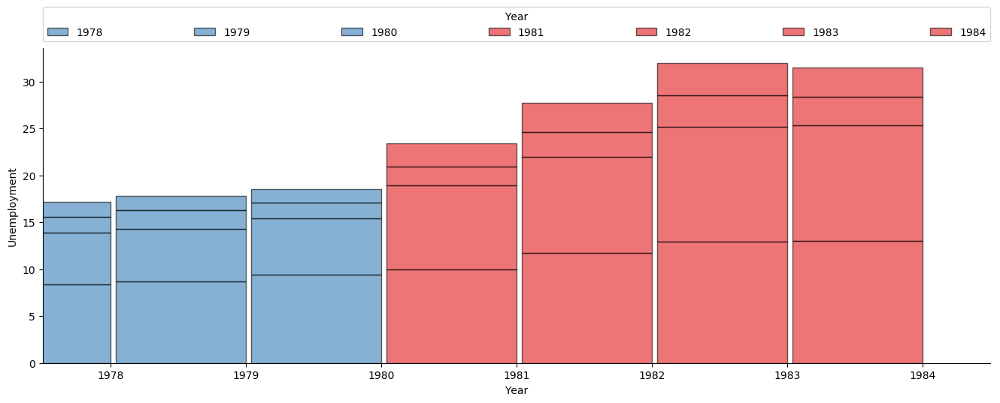

In [92]:
# selecting only a subrange of the underlying cmap to draw the colors from
%opts Bars [padding=0.02 color_by=['group']] (alpha=0.6, color=Palette('Set1', reverse=True)[0.:.2])
countries = {'Belgium', 'Netherlands', 'Sweden', 'Norway'}
macro.to.bars(['Country', 'Year'], 'Unemployment').select(Year=(1978, 1985), Country=countries)

### Chord Element
The Chord element allows representing the inter-relationships between data points in a graph. The nodes are arranged radially around a circle with the relationships between the data points drawn as arcs (or chords) connecting the nodes. The number of chords is scaled by a weight declared as a value dimension on the Chord element.

If the weight values are integers, they define the number of chords to be drawn between the source and target nodes directly. If the weights are floating point values, they are normalized to a default of 500 chords, which are divided up among the edges. Any non-zero weight will be assigned at least one chord.

The Chord element is a type of Graph element and shares the same constructor. The most basic constructor accepts a columnar dataset of the source and target nodes and an optional value. Here we supply a dataframe containing the number of dialogues between characters of the Les Misérables musical. The data contains source and target node indices and an associated value column

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
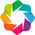

/conda/lib/python3.6/site-packages/holoviews/core/data/pandas.py:130: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  zip(columns, data)])


:Chord   [source,target]   (value)

In [124]:
from bokeh.sampledata.les_mis import data
hv.extension('bokeh')
%output size=200
links = pd.DataFrame(data['links'])
nodes = hv.Dataset(pd.DataFrame(data['nodes']), 'index')
%opts Chord [label_index='name' color_index='index' edge_color_index='source'] 
%opts Chord (cmap='Category20' edge_cmap='Category20')
hv.Chord((links, nodes)).select(value=(5, None))

### Multiple key value dimensions by Heatmaps

/conda/lib/python3.6/site-packages/holoviews/core/data/pandas.py:175: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([col.data for col in cast_objs])


:Layout
   .HeatMap.I   :HeatMap   [year,country]   (gdp)
   .HeatMap.II  :HeatMap   [year,country]   (unem)
   .HeatMap.III :HeatMap   [year,country]   (capmob)
   .HeatMap.IV  :HeatMap   [year,country]   (trade)
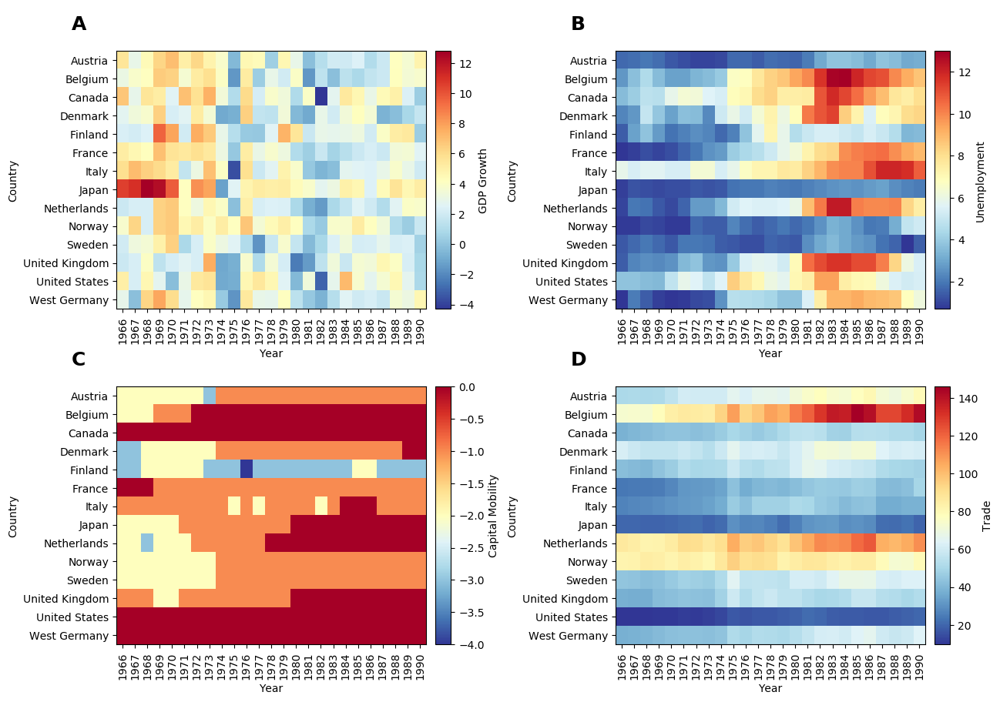

In [96]:
%opts HeatMap [show_values=False xticks=40 xrotation=90 aspect=1.2 invert_yaxis=True colorbar=True]
%opts Layout [aspect_weight=1 fig_size=150 sublabel_position=(-0.2, 1.)]
# Layouts are useful for heterogeneous data you want to lay out next to each other
hv.Layout([macro.to.heatmap(['Year', 'Country'], value)
           for value in macro.data.columns[2:]]).cols(2)

### Complex figures
Since all HoloViews Elements are composable, we can generate complex figures just by applying the * operator. We'll simply reuse the GDP curves we generated earlier, combine them with the scatter points (which indicate the unemployment rate by size) and annotate the data with some descriptions of what happened economically in these years.

:NdOverlay   [country]
   :Scatter   [year]   (gdp,unem)
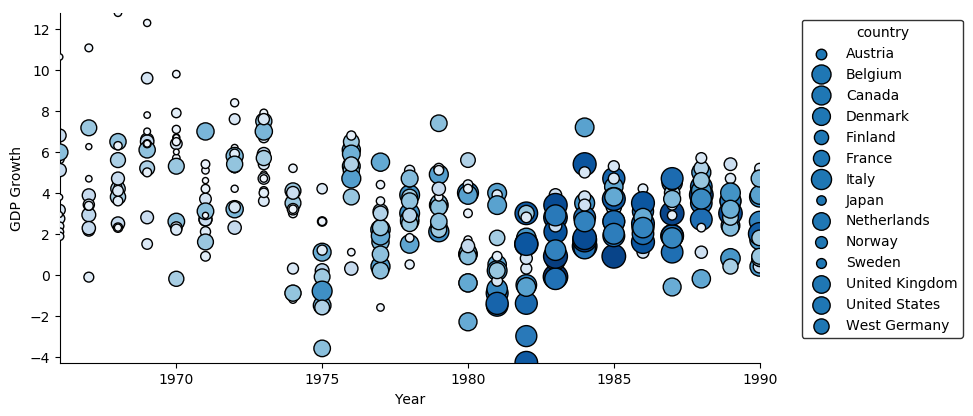

In [98]:
%opts Scatter [scaling_method='width' scaling_factor=2 size_index=2] (color=Palette('Set3') edgecolors='k')
gdp_unem_scatter = macro.to.scatter('Year', ['GDP Growth', 'Unemployment'])
gdp_unem_scatter.overlay('Country')


In [99]:
%opts Curve (color='k') Scatter [color_index=2 size_index=2 scaling_factor=1.4] (cmap='Blues' edgecolors='k')
# applying the * operator
macro_overlay = gdp_curves * gdp_unem_scatter
annotations = hv.Arrow(1973, 8, 'Oil Crisis', 'v') * hv.Arrow(1975, 6, 'Stagflation', 'v') *\
hv.Arrow(1979, 8, 'Energy Crisis', 'v') * hv.Arrow(1981.9, 5, 'Early Eighties\n Recession', 'v')
macro_overlay * annotations

:HoloMap   [country]
   :Overlay
      .Curve.I   :Curve   [year]   (gdp)
      .Scatter.I :Scatter   [year]   (gdp,unem)
      .Arrow.I   :Arrow   [x,y]
      .Arrow.II  :Arrow   [x,y]
      .Arrow.III :Arrow   [x,y]
      .Arrow.IV  :Arrow   [x,y]

:NdLayout   [country]
   :Overlay
      .Curve.I   :Curve   [year]   (gdp)
      .Scatter.I :Scatter   [year]   (gdp,unem)
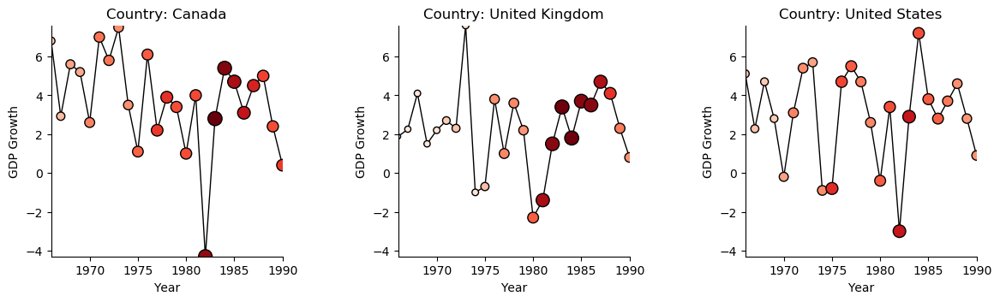

In [100]:
# lay out a subset of the countries side by side
%opts NdLayout [figure_size=100] Overlay [aspect=1] Scatter [color_index=2] (cmap='Reds')
countries = {'United States', 'Canada', 'United Kingdom'}
(gdp_curves * gdp_unem_scatter).select(Country=countries).layout('Country')

In [102]:
# combine some plots for each country into a Layout, 
# giving us a quick overview of each economic indicator for each country
%opts Scatter [color_index=2] (cmap='Reds') Overlay [aspect=1]
(macro_overlay.relabel('GDP Growth', depth=1) +\
macro.to.curve('Year', 'Unemployment', ['Country'], group='Unemployment',) +\
macro.to.curve('Year', 'Trade', ['Country'], group='Trade') +\
macro.to.scatter('GDP Growth', 'Unemployment', ['Country'])).cols(2)

:Layout
   .HoloMap.GDP_Growth :HoloMap   [country]
      :Overlay
         .Curve.I   :Curve   [year]   (gdp)
         .Scatter.I :Scatter   [year]   (gdp,unem)
   .Unemployment.I     :HoloMap   [country]
      :Curve   [year]   (unem)
   .Trade.I            :HoloMap   [country]
      :Curve   [year]   (trade)
   .HoloMap.I          :HoloMap   [country]
      :Scatter   [gdp]   (unem)